# TensorFlow Hub Object Detection 




In [2]:
import os
import pathlib

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import ops as utils_ops

import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from six.moves.urllib.request import urlopen

import tensorflow as tf
import tensorflow_hub as hub

tf.get_logger().setLevel('ERROR')

In [3]:
def load_image_into_numpy_array(path):

  image = None
  if(path.startswith('http')):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  else:
    image_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(image_data))

  (im_width, im_height) = image.size
    
  return np.array(image.getdata()).reshape(
      #(1,3,800,1216)).astype(np.uint8)
      (1, im_height, im_width, 3)).astype(np.uint8)


ALL_MODELS = {

    'Faster R-CNN ResNet152 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_1024x1024/1',

}

IMAGES_FOR_TEST = {
 
  'NYC' :   'object_detection/test_images/NYC2.jpg',
    
}

COCO17_HUMAN_POSE_KEYPOINTS = [(0, 1),
 (0, 2),
 (1, 3),
 (2, 4),
 (0, 5),
 (0, 6),
 (5, 7),
 (7, 9),
 (6, 8),
 (8, 10),
 (5, 6),
 (5, 11),
 (6, 12),
 (11, 12),
 (11, 13),
 (13, 15),
 (12, 14),
 (14, 16)]

## Visualization tools

To visualize the images with the proper detected boxes, keypoints and segmentation, we will use the TensorFlow Object Detection API. To install it we will clone the repo.

In [4]:
# Clone the tensorflow models repository
!git clone --depth 1 https://github.com/tensorflow/models

fatal: destination path 'models' already exists and is not an empty directory.


Intalling the Object Detection API

In [5]:
"""%%bash
sudo apt install -y protobuf-compiler
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .
"""

'%%bash\nsudo apt install -y protobuf-compiler\ncd models/research/\nprotoc object_detection/protos/*.proto --python_out=.\ncp object_detection/packages/tf2/setup.py .\npython -m pip install .\n'

In [6]:
!dir

 Volume in drive C has no label.
 Volume Serial Number is D425-2930

 Directory of C:\Users\MACIEJ\AI\Image_recogniton

24.11.2023  13:23    <DIR>          .
24.11.2023  13:23    <DIR>          ..
24.11.2023  13:15    <DIR>          .ipynb_checkpoints
14.11.2023  18:51           113˙018 animation.gif
23.11.2023  15:11           487˙438 bus.jpg
22.11.2023  12:23           243˙587 bus_res.jpg
03.11.2023  22:27         3˙328˙492 classification.ipynb
10.11.2023  14:26    <DIR>          classification_of_covid_images
10.11.2023  14:26    <DIR>          classification_of_images
04.11.2023  19:54           636˙131 classification_of_images-Copy1.ipynb
04.11.2023  19:33           563˙740 classification_of_images-Copy2.ipynb
04.11.2023  19:35           559˙587 classification_of_images-Copy3.ipynb
05.11.2023  10:27           638˙240 classification_of_images.ipynb
05.11.2023  10:17        30˙004˙596 classification_of_images_covid.ipynb
05.11.2023  10:33           306˙661 classification_of_images_r

In [7]:
!cd models/research/

In [9]:
#!cd models/research/
os.chdir("models/research/")

In [10]:
"""os.chdir("models/research/")
!protoc object_detection/protos/*.proto --python_out=.
!copy object_detection/packages/tf2/setup.py .
!python -m pip install ."""
#os.chdir("models/research/")

'os.chdir("models/research/")\n!protoc object_detection/protos/*.proto --python_out=.\n!copy object_detection/packages/tf2/setup.py .\n!python -m pip install .'

### Load label map data (for plotting).

Label maps correspond index numbers to category names, so that when our convolution network predicts `5`, we know that this corresponds to `airplane`.  Here we use internal utility functions, but anything that returns a dictionary mapping integers to appropriate string labels would be fine.

We are going, for simplicity, to load from the repository that we loaded the Object Detection API code

In [13]:
#PATH_TO_LABELS = './models/research/object_detection/data/mscoco_label_map.pbtxt'
PATH_TO_LABELS = './object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

## Build a detection model and load pre-trained model weights

Here we will choose which Object Detection model we will use.
Select the architecture and it will be loaded automatically.
If you want to change the model to try other architectures later, just change the next cell and execute following ones.

**Tip:** if you want to read more details about the selected model, you can follow the link (model handle) and read additional documentation on TF Hub. After you select a model, we will print the handle to make it easier.

In [14]:
# Model Selection { display-mode: "form", run: "auto" }
model_display_name = 'Faster R-CNN ResNet152 V1 1024x1024' #'['CenterNet HourGlass104 512x512','CenterNet HourGlass104 Keypoints 512x512','CenterNet HourGlass104 1024x1024','CenterNet HourGlass104 Keypoints 1024x1024','CenterNet Resnet50 V1 FPN 512x512','CenterNet Resnet50 V1 FPN Keypoints 512x512','CenterNet Resnet101 V1 FPN 512x512','CenterNet Resnet50 V2 512x512','CenterNet Resnet50 V2 Keypoints 512x512','EfficientDet D0 512x512','EfficientDet D1 640x640','EfficientDet D2 768x768','EfficientDet D3 896x896','EfficientDet D4 1024x1024','EfficientDet D5 1280x1280','EfficientDet D6 1280x1280','EfficientDet D7 1536x1536','SSD MobileNet v2 320x320','SSD MobileNet V1 FPN 640x640','SSD MobileNet V2 FPNLite 320x320','SSD MobileNet V2 FPNLite 640x640','SSD ResNet50 V1 FPN 640x640 (RetinaNet50)','SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)','SSD ResNet101 V1 FPN 640x640 (RetinaNet101)','SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)','SSD ResNet152 V1 FPN 640x640 (RetinaNet152)','SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)','Faster R-CNN ResNet50 V1 640x640','Faster R-CNN ResNet50 V1 1024x1024','Faster R-CNN ResNet50 V1 800x1333','Faster R-CNN ResNet101 V1 640x640','Faster R-CNN ResNet101 V1 1024x1024','Faster R-CNN ResNet101 V1 800x1333','Faster R-CNN ResNet152 V1 640x640','Faster R-CNN ResNet152 V1 1024x1024','Faster R-CNN ResNet152 V1 800x1333','Faster R-CNN Inception ResNet V2 640x640','Faster R-CNN Inception ResNet V2 1024x1024','Mask R-CNN Inception ResNet V2 1024x1024']
model_handle = ALL_MODELS[model_display_name]

print('Selected model:'+ model_display_name)
print('Model Handle at TensorFlow Hub: {}'.format(model_handle))

Selected model:Faster R-CNN ResNet152 V1 1024x1024
Model Handle at TensorFlow Hub: https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_1024x1024/1


## Loading the selected model from TensorFlow Hub

Here we just need the model handle that was selected and use the Tensorflow Hub library to load it to memory.


In [15]:
print('loading model...')
hub_model = hub.load(model_handle)
print('model loaded!')

loading model...
model loaded!


## Loading an image

Let's try the model on a simple image. To help with this, we provide a list of test images.

Here are some simple things to try out if you are curious:
* Try running inference on your own images, just upload them to colab and load the same way it's done in the cell below.
* Modify some of the input images and see if detection still works.  Some simple things to try out here include flipping the image horizontally, or converting to grayscale (note that we still expect the input image to have 3 channels).

**Be careful:** when using images with an alpha channel, the model expect 3 channels images and the alpha will count as a 4th.



In [16]:
!dir

 Volume in drive C has no label.
 Volume Serial Number is D425-2930

 Directory of C:\Users\MACIEJ\AI\Image_recogniton\models\research

16.11.2023  15:59    <DIR>          .
16.11.2023  15:59    <DIR>          ..
16.11.2023  14:55    <DIR>          adversarial_text
16.11.2023  14:55    <DIR>          attention_ocr
16.11.2023  14:55    <DIR>          audioset
16.11.2023  14:55    <DIR>          autoaugment
16.11.2023  15:59    <DIR>          build
16.11.2023  14:55    <DIR>          cognitive_planning
16.11.2023  14:55    <DIR>          cvt_text
16.11.2023  14:55    <DIR>          deeplab
16.11.2023  14:55    <DIR>          deep_speech
16.11.2023  14:55    <DIR>          delf
16.11.2023  14:55    <DIR>          efficient-hrl
16.11.2023  14:55    <DIR>          lfads
16.11.2023  14:55    <DIR>          lstm_object_detection
16.11.2023  14:55    <DIR>          marco
16.11.2023  14:55    <DIR>          nst_blogpost
16.11.2023  16:11    <DIR>          object_detection
16.11.2023  17:43    <

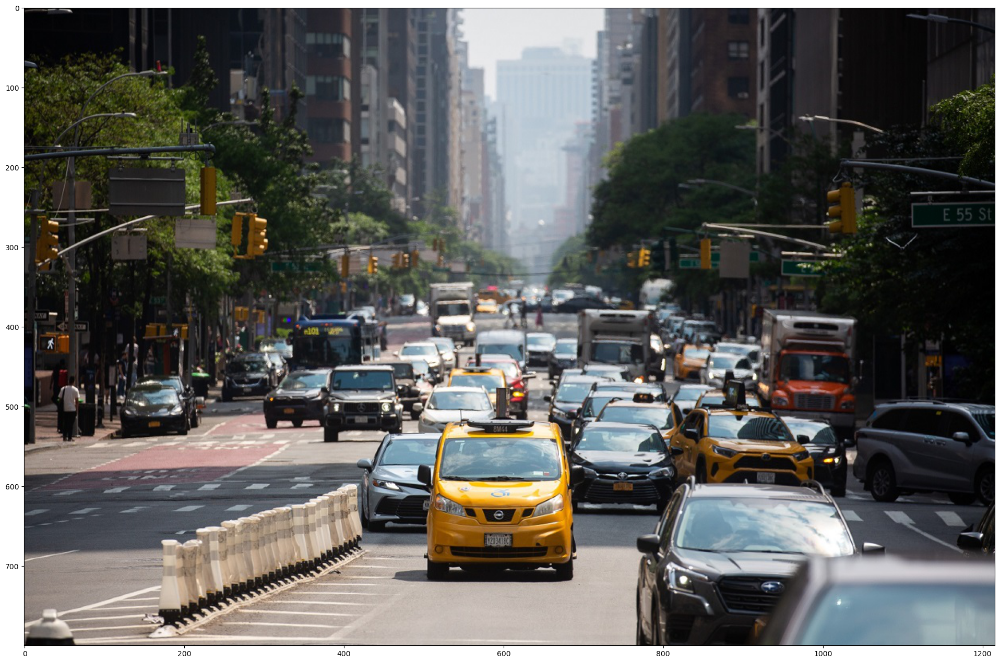

In [18]:

selected_image = 'NYC'
 
flip_image_horizontally = False 
convert_image_to_grayscale = False 

image_path = IMAGES_FOR_TEST[selected_image]
image_np = load_image_into_numpy_array(image_path)

if(flip_image_horizontally)
  image_np[0] = np.fliplr(image_np[0]).copy()

if(convert_image_to_grayscale):
  image_np[0] = np.tile(
    np.mean(image_np[0], 2, keepdims=True), (1, 1, 3)).astype(np.uint8)


plt.figure(figsize=(24,32))
plt.imshow(image_np[0].reshape(800,1216,3))
plt.show()

In [19]:
hub_model

<tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject at 0x24f70c53910>

In [20]:
image_np.size

2918400

In [21]:
image_np.shape

(1, 800, 1216, 3)

In [22]:
imgtest = image_np.reshape(1, 3, 800,1216)
imgtest.shape

(1, 3, 800, 1216)

In [23]:
results=hub_model(image_np) 
result = {key:value.numpy() for key,value in results.items()}


dict_keys(['raw_detection_boxes', 'num_detections', 'detection_boxes', 'detection_classes', 'detection_multiclass_scores', 'raw_detection_scores', 'detection_anchor_indices', 'detection_scores'])


## Visualizing the results


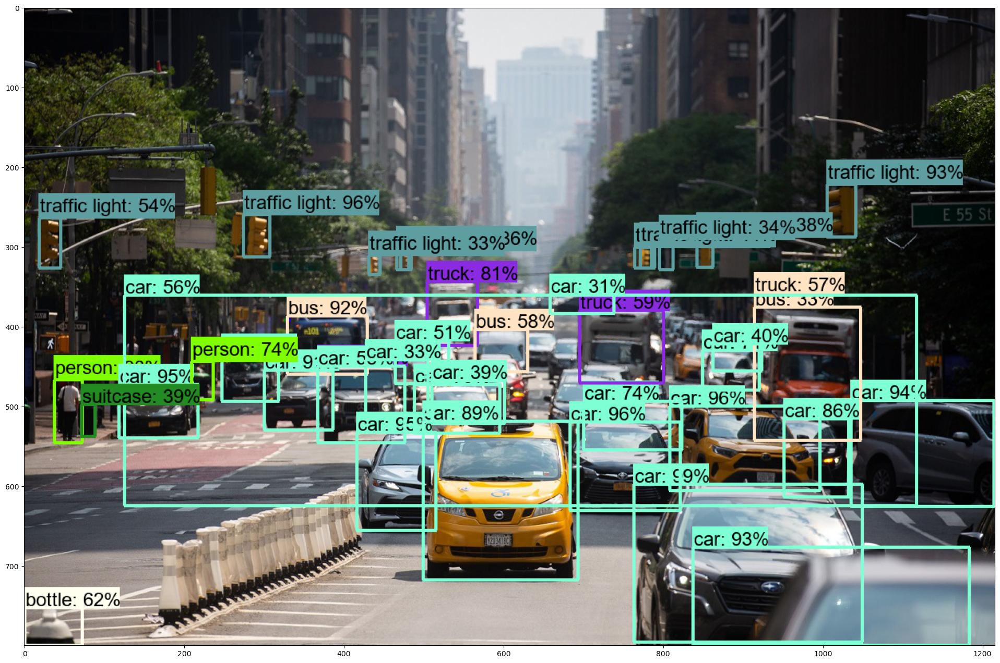

In [24]:
label_id_offset = 0
image_np_with_detections = image_np.copy()

# Use keypoints if available in detections
keypoints, keypoint_scores = None, None
if 'detection_keypoints' in result:
  keypoints = result['detection_keypoints'][0]
  keypoint_scores = result['detection_keypoint_scores'][0]

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections[0],
      result['detection_boxes'][0],
      (result['detection_classes'][0] + label_id_offset).astype(int),
      result['detection_scores'][0],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.30,
      agnostic_mode=False,
      keypoints=keypoints,
      keypoint_scores=keypoint_scores,
      keypoint_edges=COCO17_HUMAN_POSE_KEYPOINTS)

plt.figure(figsize=(24,32))
plt.imshow(image_np_with_detections[0])
plt.show()

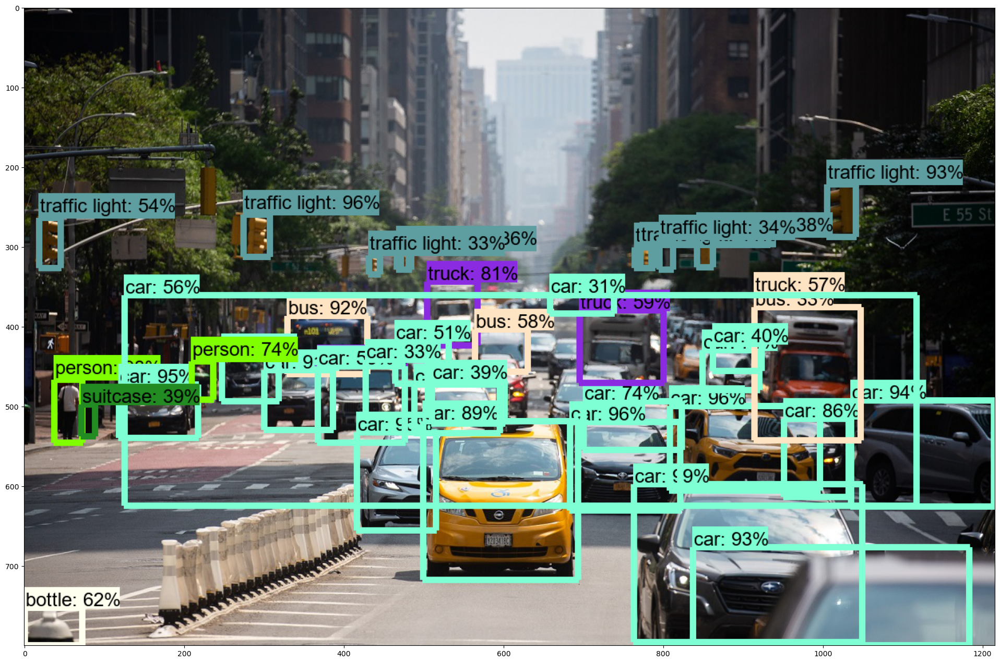

In [25]:
# Handle models with masks:
image_np_with_mask = image_np.copy()

if 'detection_masks' in result:
  # we need to convert np.arrays to tensors
  detection_masks = tf.convert_to_tensor(result['detection_masks'][0])
  detection_boxes = tf.convert_to_tensor(result['detection_boxes'][0])

  # Reframe the bbox mask to the image size.
  detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes,
              image_np.shape[1], image_np.shape[2])
  detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                      tf.uint8)
  result['detection_masks_reframed'] = detection_masks_reframed.numpy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_mask[0],
      result['detection_boxes'][0],
      (result['detection_classes'][0] + label_id_offset).astype(int),
      result['detection_scores'][0],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.30,
      agnostic_mode=False,
      instance_masks=result.get('detection_masks_reframed', None),
      line_thickness=8)

plt.figure(figsize=(24,32))
plt.imshow(image_np_with_mask[0])
plt.show()